# Embedding plots

In [9]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [10]:
import os,sys
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import scipy.sparse
import anndata
import seaborn as sns
import scvelo as scv

In [11]:
figdir = "/home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/embedding_figures/"
if os.path.exists(figdir):
    sc.settings.figdir = figdir
    scv.settings.figdir = figdir
else:
    os.mkdir(figdir)
    sc.settings.figdir = figdir
    scv.settings.figdir = figdir
    
sc.set_figure_params(vector_friendly=True, fontsize=18)
scv.set_figure_params(vector_friendly=True, fontsize=18)

In [12]:
## r2py setup
import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

anndata2ri.activate()

In [13]:
%load_ext rpy2.ipython


The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [14]:
%%R
library(tidyverse)
library(reshape2)
library(patchwork)

remove_x_axis <- function(){
  theme(axis.text.x = element_blank(), axis.ticks.x = element_blank(), axis.title.x = element_blank())  
}

remove_y_axis <- function(){
  theme(axis.text.y = element_blank(), axis.ticks.y = element_blank(), axis.title.y = element_blank())  
}

In [15]:
### Load data

data_dir = '/nfs/team205/ed6/data/Fetal_immune/'
timestamp = '20210429'

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


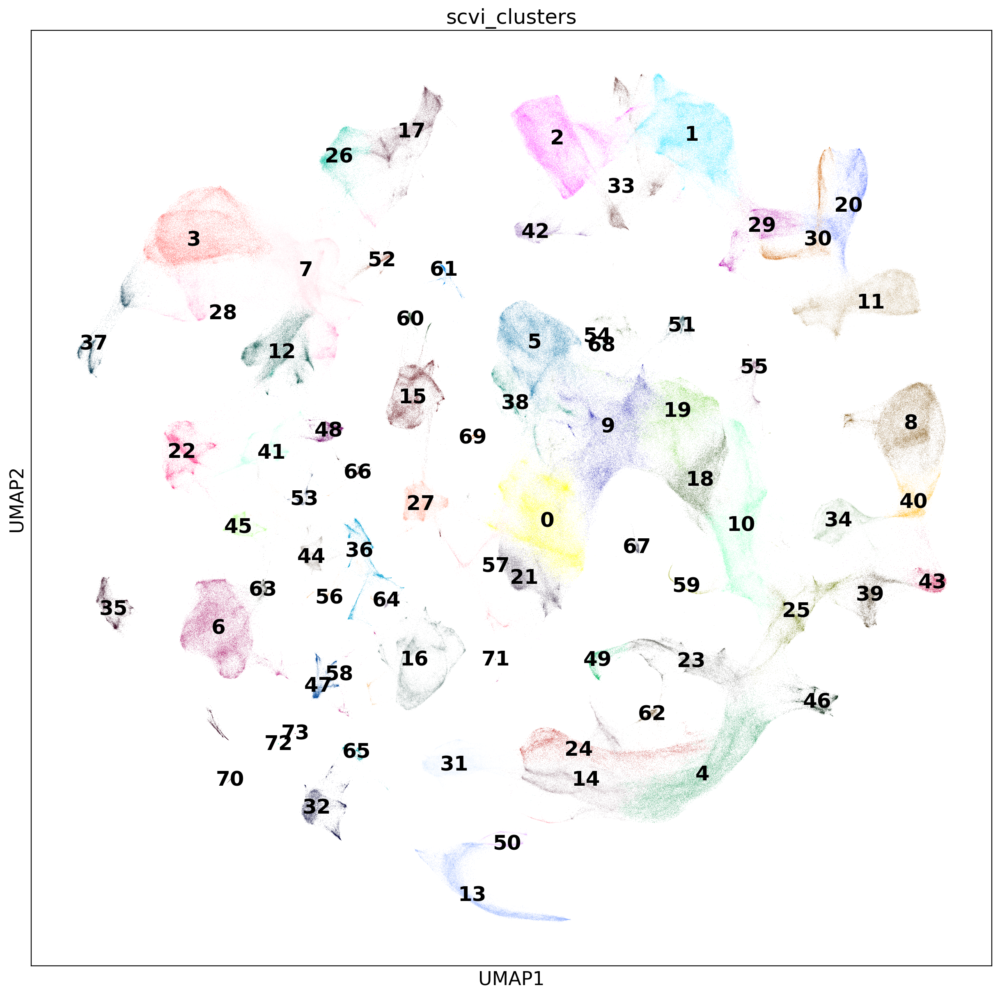

In [16]:
adata = sc.read_h5ad('{d}PAN.A01.v01.entire_data_normalised_log.{t}.h5ad'.format(d=data_dir, t=timestamp))

### Load results from scVI

def load_scvi_outs(adata, emb_file):
    X_scVI_emb = np.load(emb_file)
    X_scVI_umap = np.load(emb_file.rstrip(".npy") + ".UMAP.npy")
    X_scVI_clust = pd.read_csv(emb_file.rstrip(".npy") + ".clustering.csv", index_col=0)
    adata.obsm["X_scvi"] = X_scVI_emb
    adata.obsm["X_umap"] = X_scVI_umap
    adata.obs["scvi_clusters"] = X_scVI_clust.loc[adata.obs_names]["leiden_150"].astype("category")

load_scvi_outs(adata, data_dir + "scVI_outs/PAN.A01.v01.entire_data_raw_count.{t}.scVI_out.npy".format(t=timestamp))

plt.rcParams["figure.figsize"] = [15,15]
sc.pl.umap(adata, color="scvi_clusters", legend_loc="on data")

In [17]:
## Filter maternal contaminants
mat_barcodes = pd.read_csv("~/Pan_fetal_immune/metadata/souporcell_results/maternal_barcodes.csv", index_col=0)
mat_barcodes["x"] = pd.Series([x.split("-1")[0] for x in mat_barcodes['x']])

#### Save for data sharing

In [ ]:
adata.var_names_make_unique()

## Mark maternal contaminants
adata.obs['is_maternal_contaminant'] = adata.obs_names.isin(mat_barcodes)

# ## Add fine cell type annotations
# adata.obs['anno_lvl_2_final_clean'] = np.nan
# adata.obs.loc[adata.obs_names.isin(anno_obs.index), 'anno_lvl_2_final_clean'] = anno_obs.loc[adata.obs_names[adata.obs_names.isin(anno_obs.index)]]['anno_lvl_2_final_clean']

In [20]:
## Add fine cell type annotations and other metadata cols
add_metadata_cols = ['organ',
                 'Sort_id', 'age', 'method', 'donor', 'sex','uniform_label_expanded_merged',
                 'Sample','anno_lvl_2_final_clean']
for col in add_metadata_cols:
    adata.obs[col] = np.nan
    adata.obs.loc[adata.obs_names.isin(anno_obs.index), col] = anno_obs.loc[adata.obs_names[adata.obs_names.isin(anno_obs.index)]][col]

In [21]:
## Rename some obs columns
adata.obs['celltype_annotation'] = adata.obs['anno_lvl_2_final_clean'].copy()
adata.obs['old_annotation_uniform'] = adata.obs['uniform_label_expanded_merged'].copy()

keep_obs_cols = ['n_counts', 
                 'n_genes', 
                 'file', 
                 'mito', 
                 'doublet_scores',
                 'predicted_doublets', 
                 'old_annotation_uniform', 
                 'organ',
                 'Sort_id', 'age', 'method', 'donor', 'sex',
                 'Sample', 
                 'scvi_clusters', 
                 'is_maternal_contaminant',
                 'anno_lvl_2_final_clean', 
                 'celltype_annotation']

adata.obs = adata.obs[keep_obs_cols].copy()

In [37]:
## Clean uns
adata.uns = {k:v for k,v in adata.uns.items() if not k.endswith("_colors")}

## Store the raw count matrix
adata_raw = sc.read_h5ad(data_dir + 'PAN.A01.v01.entire_data_raw_count.{t}.h5ad'.format(t=timestamp))
adata.X = adata_raw.X.copy()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [41]:
del adata_raw

In [23]:
output_dir = data_dir + 'cellxgene_h5ad_files/scRNA_data/'
adata.write_h5ad(output_dir + 'PAN.A01.v01.raw_count.{t}.{s}.embedding.h5ad'.format(t=timestamp, s="PFI"))

... storing 'old_annotation_uniform' as categorical
... storing 'organ' as categorical
... storing 'Sort_id' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical
... storing 'sex' as categorical
... storing 'Sample' as categorical
... storing 'anno_lvl_2_final_clean' as categorical
... storing 'celltype_annotation' as categorical


In [12]:
output_dir = data_dir + 'cellxgene_h5ad_files/scRNA_data/'
adata = sc.read_h5ad(output_dir + 'PAN.A01.v01.raw_count.{t}.PFI.embedding.h5ad'.format(t=timestamp))

In [24]:
import gc
gc.collect()

709

In [25]:
# log normalize
sc.pp.normalize_per_cell(adata, counts_per_cell_after=10e4)
sc.pp.log1p(adata)
# Remove unnecessary components
adata.uns = {}
adata.obsp = {}
del adata.obsm['X_scvi']
adata.write_h5ad(output_dir + 'PAN.A01.v01.raw_count.{t}.{s}.embedding.cellxgene.h5ad'.format(t=timestamp, s="PFI"))

### Load annotations

In [18]:
anno_obs = pd.read_csv(data_dir + "PAN.A01.v01.entire_data_normalised_log.20210429.full_obs.annotated.clean.csv", index_col=0)

In [19]:
adata = adata[(~adata.obs_names.isin(mat_barcodes["x"])) & (adata.obs_names.isin(anno_obs.index))]

In [ ]:
adata.obs = anno_obs.loc[adata.obs_names].copy()

In [ ]:
adata.n_obs

### Plot by lineage

In [ ]:
## Read annotation groupings
import json
with open('../../metadata/anno_groups.json', 'r') as json_file:
    anno_groups_dict = json.load(json_file)
anno_groups_dict_rev = {x:g for g,a in anno_groups_dict.items() for x in a}

In [ ]:
adata.obs["anno_group"] = [anno_groups_dict_rev[x] for x in adata.obs["anno_lvl_2_final_clean"]]

In [ ]:
print("No. of low quality cells: "+str(sum(adata.obs['anno_group'] == "OTHER")))

In [ ]:
sum(adata.obs['anno_group'] == "OTHER")/adata.n_obs

In [ ]:
adata.obs[adata.obs['anno_group'] != "OTHER"]['anno_lvl_2_final_clean'].unique().shape

In [ ]:
plt.rcParams["figure.figsize"] = [15,15]
sc.pl.umap(adata, color="anno_group", legend_loc="on data")

In [ ]:
import copy
anno_groups_lvl0 = copy.deepcopy(anno_groups_dict)

anno_groups_lvl0["FIBROBLASTS"] = [x for x in anno_groups_dict["STROMA"] if "FIBROBLAST" in x]
anno_groups_lvl0["ENDOTHELIUM"] = [x for x in anno_groups_dict["STROMA"] if "ENDOTHELIUM" in x]
anno_groups_lvl0["SMOOTH MUSCLE"] = [x for x in anno_groups_dict["STROMA"] if "VSMC" in x]
anno_groups_lvl0["SMOOTH MUSCLE"].append("SMOOTH_MUSCLE")
anno_groups_lvl0["SKELETAL MUSCLE"] = ['MUSCLE_SATELLITE', 'SKELETAL_MUSCLE']
anno_groups_lvl0["MEGAKARYOCYTE"] = [x for x in anno_groups_dict["ERYTHROID CELLS"] if "MK" in x]
anno_groups_lvl0["TISSUE STROMA"] = [x for x in anno_groups_dict["STROMA"] if x not in anno_groups_lvl0["ENDOTHELIUM"]+anno_groups_lvl0["FIBROBLASTS"]+anno_groups_lvl0["SKELETAL MUSCLE"]+anno_groups_lvl0["SMOOTH MUSCLE"]]

anno_groups_lvl0["NK/T CELLS"].extend(anno_groups_dict["ILC"])
for x in anno_groups_lvl0['ILC']:
    anno_groups_lvl0['NK/T CELLS'].remove(x) 

anno_groups_lvl0["MYELOID"].remove('LMPP_MLP')
anno_groups_lvl0["PROGENITORS"].extend(['ELP', "LMPP_MLP"])
anno_groups_lvl0["ERYTHROID CELLS"].remove('PROMYELOCYTE')
anno_groups_lvl0["PROGENITORS"].append('PROMYELOCYTE')
# anno_groups_lvl0["MYELOID"].append('ERY_MACROPHAGE')
# anno_groups_lvl0["TISSUE STROMA"].remove('PERIVASCULAR_MACROPHAGE')
# anno_groups_lvl0["MYELOID"].append('PERIVASCULAR_MACROPHAGE')
anno_groups_lvl0["MYELOID"].remove('EOSINOPHIL_BASOPHIL')
anno_groups_lvl0["MYELOID"].remove('MAST_CELL')
anno_groups_lvl0['EO/BASO/MAST'] = ['EOSINOPHIL_BASOPHIL', "MAST_CELL"]
anno_groups_lvl0["MYELOID"].append('pDC')

# anno_groups_lvl0.pop("PDC")
anno_groups_lvl0.pop("STROMA")
# anno_groups_lvl0.pop("ILC")


In [ ]:
anno_groups_lvl0_rev = {x:g for g,a in anno_groups_lvl0.items() for x in a}

In [ ]:
adata.obs["anno_group_lvl0"] = [anno_groups_lvl0_rev[x] for x in adata.obs["anno_lvl_2_final_clean"]]

In [ ]:
plt.rcParams["figure.figsize"] = [15,15]
scv.pl.umap(adata, color="anno_group_lvl0", legend_loc="on data", size=3, 
#            groups= anno_groups_lvl0["ERYTHROID CELLS"]
           groups = [x for x in anno_groups_lvl0.keys() if x !="OTHER"],palette=sc.plotting.palettes.vega_20_scanpy,
           save="embedding_lineage.pdf"
          )

### Plot by organ

In [ ]:
## load palette
org_colors = pd.read_csv("../../metadata/organ_colors.csv")
org_colors = org_colors[["organ", "color"]]
org_colors.index = org_colors["organ"]

In [ ]:
adata.uns["organ_colors"] = org_colors.loc[adata.obs["organ"].cat.categories]["color"].values

In [ ]:
fig, ax = plt.subplots(3,3, figsize=(15,15))
for i in range(len(org_colors.organ)):
    row = int(i/3) 
    col = int(i - (3*row))
    scv.pl.umap(adata, color="organ", groups=org_colors.organ[i], size=3, legend_loc="none", ax=ax[row,col], show=False)
fig.show()

In [ ]:
fig.savefig(figdir + "embedding_organs.pdf")

### Barplot by organ

#### Split raw numbers by sort

In [57]:
### Fix sort ids
adata.obs["Sort_id"] = ["CD45P" if x == "CD45P_CD45N" else x for x in adata.obs["Sort_id"]]
adata.obs["Sort_id"] = ["CD45N" if x == "CD45EN" else x for x in adata.obs["Sort_id"]]

### Exclude cells from unconventional sorts
adata = adata[adata.obs["Sort_id"].isin(["CD45P", "CD45N", "TOT"])]

In [58]:
adata.obs.Sort_id.value_counts()

CD45P    408671
CD45N    376504
TOT      117199
Name: Sort_id, dtype: int64

In [59]:
lineage_counts = adata.obs[["anno_group_lvl0", "donor","organ", 'sex', 'Sort_id']].groupby(["donor","anno_group_lvl0", "organ", 'Sort_id']).size().reset_index()
lineage_counts.columns = ["donor", "lineage", "organ", 'Sort_id',"n_cells"]

In [60]:
anno_colors = adata.uns['anno_group_lvl0_colors']
anno_names = adata.obs['anno_group_lvl0'].cat.categories
anno_order = ['PROGENITORS', 'MEGAKARYOCYTE','ERYTHROID CELLS', 'EO/BASO/MAST','MYELOID', 'B CELLS', "ILC", 'NK/T CELLS', 
       'ENDOTHELIUM', 'FIBROBLASTS', 'SKELETAL MUSCLE', 'SMOOTH MUSCLE', 'TISSUE STROMA', 'OTHER']

In [73]:
with open("../../metadata/broad_annotation_dict.json", 'w') as f:
    json.dump(anno_groups_lvl0, f)

In [70]:
## Save color palette for broad annotation 
# (for spatial plots)
anno_colors_palette = pd.DataFrame(anno_colors, index=anno_names)
anno_colors_palette.columns=['color']
anno_colors_palette.to_csv('../../metadata/broad_annotation_colors.csv')

In [74]:
%%R -i lineage_counts -i anno_names -i anno_colors -i anno_order -i figdir -w 1500 -h 300
organ_order = c("YS", "LI", "BM", "TH", "SP", "MLN", "SK", "KI", "GU")
anno_colors <- setNames(anno_colors, anno_names)

pl <- lineage_counts %>%
#     filter(n_cells > 0) %>%
    mutate(organ=factor(organ, levels=rev(organ_order))) %>%
    mutate(lineage=factor(lineage, levels=rev(anno_order))) %>%
    arrange(lineage) %>%
    mutate(donor=factor(donor, levels=unique(donor))) %>%
    ggplot(aes(organ,n_cells, fill=lineage)) +
    geom_col(position="fill", width=0.8) +
    coord_flip() +
    facet_wrap("Sort_id") +
    scale_fill_manual(values=anno_colors, name="Cellular\ncompartment") +
    guides(fill = guide_legend(reverse=TRUE)) +
    scale_y_continuous(labels=seq(0,100, by=25)) +
    ylab("Composition (%)") +
    theme_classic(base_size=22) 
    
ggsave(paste0(figdir, "broad_organ_composition_sort.pdf"), pl, width=18, height=6)

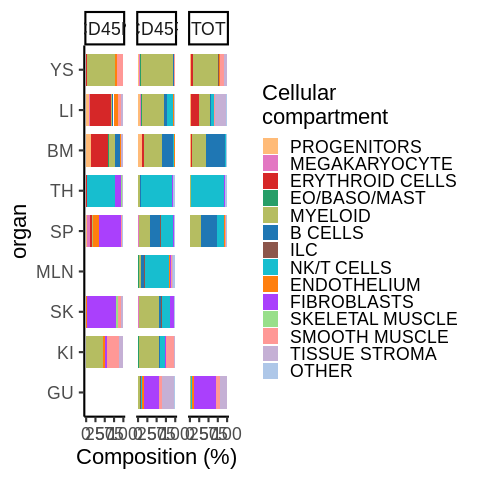

In [85]:
%%R
# lineage_counts %>%
# #     filter(n_cells > 0) %>%
#     mutate(organ=factor(organ, levels=rev(organ_order))) %>%
#     mutate(lineage=factor(lineage, levels=rev(anno_order))) %>%
# #     arrange(lineage) %>%
# #     mutate(donor=factor(donor, levels=unique(donor))) %>%
#     filter(is.na(lineage))
pl

#### FACS corrected proportions

In [75]:
facs_prop_df = pd.read_csv("/home/jovyan/mount/gdrive/Pan_fetal/meta_share/220621_FACs_gating_proportions_correct.csv")

## Keep only CD45+ and CD45- cells
facs_prop_df = facs_prop_df[facs_prop_df["sort.ids"].isin(["CD45+", "CD45-"])]

## Distinguish tissues where there have been multiple sorts by the no of total events 
facs_prop_df["sort_sample_id"] = facs_prop_df.origin + "_" + facs_prop_df["orig.ident"] + "_" + facs_prop_df.total_live_events.astype("str")

In [76]:
lineage_counts = adata.obs[["anno_group_lvl0", "donor","organ", 'file', 'Sort_id', 'method']].groupby(['anno_group_lvl0',"donor", "organ", 'file','Sort_id']).count().reset_index()
lineage_counts = lineage_counts.dropna()
lineage_counts.columns = ["lineage","donor", "organ", 'file', 'Sort_id', "n_cells"]

In [77]:
# lineage_counts = adata.obs[["anno_group_lvl0", "donor","organ", 'file', 'Sort_id', 'sex']].groupby(["donor","anno_group_lvl0", "organ", 'file','Sort_id']).size().reset_index()
# lineage_counts.columns = ["donor", "lineage", "organ", 'Sort_id', "n_cells"]
# lineage_counts

**Facs proportion correction:** 
In a sample the number of cells of a given type will be the sum of CD45+ and CD45- cells
$$
n_{true} = n_{+} + n_{-} 
$$
The true number of CD45+ and CD45- cells ($n_+$ and $n_-$) can be estimated from the number of captured cells ($\hat{n}_+$ and $\hat{n}_-$) as follows:
$$
n_{+} = f_{+}\hat{n}_{+} 
$$
where $f_{+}$ is the measured fraction of CD45+ cells. Therefore:

$$
n_{true} = f_{+}\hat{n}_{+} + f_{-}\hat{n}_{-} 
$$

In [78]:
translate_sort_id = {'CD45+':"CD45P", 'CD45-':"CD45N"}
translate_organ = dict(zip(['liver', 'skin', 'fbm', 'gut', 'spleen', 'thymus', 'kidney', 'boneMarrow', 'yolkSac'], 
                           ['LI', "SK", "BM", "GU", "SP", "TH", "KI","BM", "YS"]))
facs_prop_df['Sort_id'] = [translate_sort_id[x] for x in facs_prop_df['sort.ids']]
facs_prop_df['organ'] = [translate_organ[x] for x in facs_prop_df['origin']]
facs_df = facs_prop_df[['Sort_id', "parent_Multiplier", 'orig.ident', 'organ', "Sample.lanes"]]
facs_df.columns = ['Sort_id', "parent_Multiplier", "donor", 'organ', 'file']
# lineage_counts = pd.merge(lineage_counts, facs_df)

lineage_counts_facs = pd.merge(lineage_counts, facs_df, how='left')

In [79]:
lineage_counts[lineage_counts.organ=="MLN"]

,lineage,donor,organ,file,Sort_id,n_cells
133357,B CELLS,F72,MLN,Human_colon_16S8159186,CD45P,238.0
145147,B CELLS,F78,MLN,FCA_gut8015061,CD45P,414.0
281182,ENDOTHELIUM,F72,MLN,Human_colon_16S8159186,CD45P,62.0
292972,ENDOTHELIUM,F78,MLN,FCA_gut8015061,CD45P,34.0
429007,EO/BASO/MAST,F72,MLN,Human_colon_16S8159186,CD45P,5.0
440797,EO/BASO/MAST,F78,MLN,FCA_gut8015061,CD45P,8.0
576832,ERYTHROID CELLS,F72,MLN,Human_colon_16S8159186,CD45P,12.0
588622,ERYTHROID CELLS,F78,MLN,FCA_gut8015061,CD45P,3.0
724657,FIBROBLASTS,F72,MLN,Human_colon_16S8159186,CD45P,94.0
736447,FIBROBLASTS,F78,MLN,FCA_gut8015061,CD45P,107.0


In [80]:
## Get corrected n_cell
lineage_counts_facs['corrected_n_cells'] = lineage_counts_facs["n_cells"]*lineage_counts_facs['parent_Multiplier']
# if no FACS info is available, use true count
lineage_counts_facs.loc[lineage_counts_facs['parent_Multiplier'].isna(), 'corrected_n_cells'] = lineage_counts_facs.loc[lineage_counts_facs['parent_Multiplier'].isna(), 'n_cells']

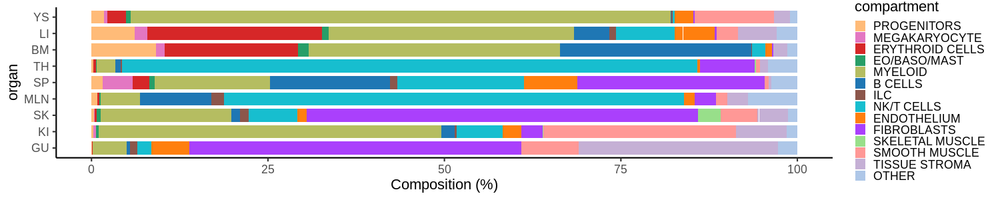

In [81]:
%%R -i lineage_counts_facs -i anno_names -i anno_colors -i anno_order -i figdir -w 1500 -h 300
organ_order = c("YS", "LI", "BM", "TH", "SP", "MLN", "SK", "KI", "GU")
anno_colors <- setNames(anno_colors, anno_names)

lineage_counts_facs %>%
#     filter(n_cells > 0) %>%
    mutate(organ=factor(organ, levels=rev(organ_order))) %>%
    mutate(lineage=factor(lineage, levels=rev(anno_order))) %>%
    arrange(lineage) %>%
    mutate(donor=factor(donor, levels=unique(donor))) %>%
    ggplot(aes(organ,n_cells, fill=lineage)) +
    geom_col(position="fill", width=0.8) +
    coord_flip() +
#     facet_wrap("Sort_id") +
    scale_fill_manual(values=anno_colors, name="Cellular\ncompartment") +
    guides(fill = guide_legend(reverse=TRUE)) +
    scale_y_continuous(labels=seq(0,100, by=25)) +
    ylab("Composition (%)") +
    theme_classic(base_size=22) 
    
# ggsave(paste0(figdir, "broad_organ_composition_sort.pdf"), pl, width=18, height=6)

In [90]:
%%R -i lineage_counts_facs -i anno_names -i anno_colors -i anno_order -i figdir -h 800 -w 600
organ_order = c("YS", "LI", "BM", "TH", "SP", "MLN", "SK", "KI", "GU")
anno_colors <- setNames(anno_colors, anno_names)

pl <- lineage_counts_facs %>%
#     filter(n_cells > 0) %>%
    mutate(organ=factor(organ, levels=organ_order)) %>%
    mutate(lineage=factor(lineage, levels=anno_order)) %>%
    arrange(lineage) %>%
    mutate(donor=factor(donor, levels=unique(donor))) %>%
    ggplot(aes(organ,corrected_n_cells, fill=lineage)) +
    geom_col(position="fill", width=0.8) +
#     coord_flip() +
#     facet_wrap("Sort_id") +
    scale_fill_manual(values=anno_colors, name="Cellular\ncompartment") +
    guides(fill = guide_legend(reverse=FALSE)) +
    scale_y_continuous(labels=seq(0,100, by=25)) +
    ylab("Composition (%)") +
    theme_classic(base_size=28) +
    theme(axis.text.x=element_text(angle=45, hjust=1, vjust=1))
    
ggsave(paste0(figdir, "broad_organ_composition_FACScorrected_vertical.pdf"), pl, width=8, height=10)

### Embeddings + metadata

In [379]:
adata.obs["age"] = adata.obs["age"].astype("int")

In [374]:
scv.settings.figdir = figdir

saving figure to file /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/embedding_figures/scvelo_metadata_embeddings.pdf


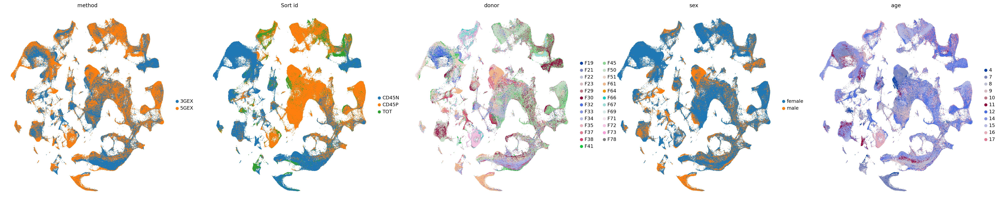

In [376]:
scv.pl.umap(adata, color=['method', "Sort_id", "donor", "sex", "age"], legend_loc="right margin", size=3, save="metadata_embeddings.pdf")

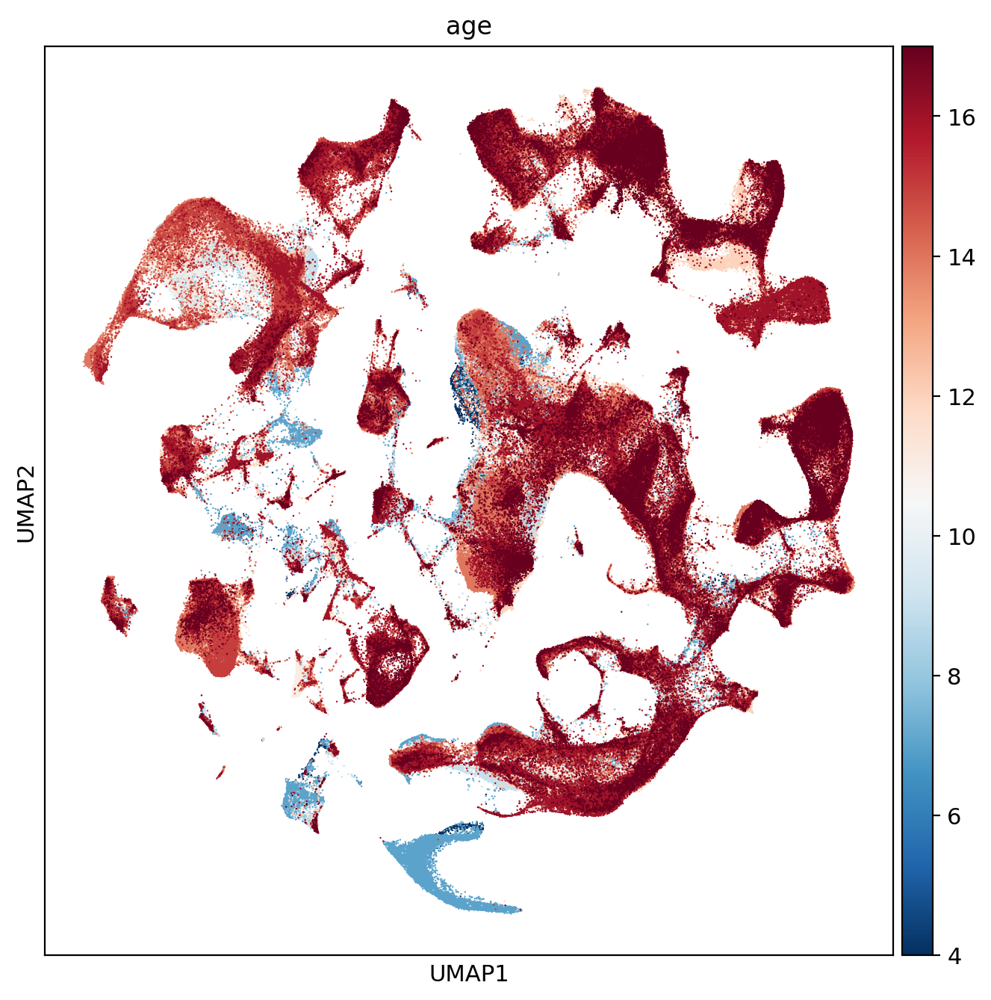

In [383]:
adata.obs["age"] = adata.obs["age"].astype("int")
sc.pl.umap(adata, color=["age"], legend_loc="right margin", size=3, save="age_embeddings.pdf", sort_order=False)

## Illustration of splits for annotation

In [103]:
def load_scvi_outs(adata, emb_file, load_clustering=True):
    X_scVI_emb = np.load(emb_file)
    X_scVI_umap = np.load(emb_file.rstrip(".npy") + ".UMAP.npy")
    adata.obsm["X_scvi"] = X_scVI_emb
    adata.obsm["X_umap"] = X_scVI_umap
    if load_clustering:
        X_scVI_clust = pd.read_csv(emb_file.rstrip(".npy") + ".clustering.csv", index_col=0)
        adata.obs["scvi_clusters"] = X_scVI_clust.loc[adata.obs_names]["leiden_150"].astype("category")

def load_data_split(data_dir, timestamp, split):
    # Load estimated gene dispersions for HVG selection
    # Generated running `Pan_fetal_immune/utils/PFI_pp_4_HVG_stats.py`
    adata_lognorm_var = pd.read_csv(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.var.csv'.format(t=timestamp, s=split), index_col=0)

    ### Load gex data
    adata_raw = sc.read_h5ad(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.h5ad'.format(t=timestamp, s=split))
    adata_raw.var_names_make_unique()

    # Load obs
    new_obs = pd.read_csv(data_dir + "PAN.A01.v01.entire_data_normalised_log.{t}.full_obs.csv".format(t=timestamp), index_col=0)
    adata_raw.obs = new_obs.loc[adata_raw.obs_names]

    ## Load var
    adata_raw.var = adata_lognorm_var.copy()

    ## Add batch key
    adata_raw.obs["bbk"] = adata_raw.obs["method"] + adata_raw.obs["donor"]
    return(adata_raw)

In [92]:
adata = adata.copy()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [12]:
[anno[x] for x in adata.obs['anno_lvl_2_final_clean']]

FCAImmP7579224-ATTACTCTCGATGAGG          CYCLING_DC
FCAImmP7579224-CAGCCGAGTACATCCA           EARLY_ERY
FCAImmP7579224-TGCTACCTCATGTAGC             PRE_DC2
FCAImmP7579224-ACGGCCACAAGCTGAG    MONOCYTE_II_CCR2
FCAImmP7579224-CTAATGGCACTGTGTA         LARGE_PRE_B
                                         ...       
FCAImmP7803042-AGTGGGAGTCGACTGC     FIBROBLAST_XIII
FCAImmP7803042-CCATTCGTCAACACAC        FIBROBLAST_V
FCAImmP7803042-CGTAGCGAGTGACATA        FIBROBLAST_I
FCAImmP7803042-TGGCCAGCAATGAAAC       FIBROBLAST_IV
FCAImmP7803042-ATTGGACAGGAGTACC        KERATINOCYTE
Name: anno_lvl_2_final_clean, Length: 911873, dtype: category
Categories (138, object): ['ABT(ENTRY)', 'AS_DC', 'B1', 'CD4+T', ..., 'VSMC_PERICYTE_II', 'VSMC_PERICYTE_III', 'YS_ERY', 'YS_STROMA']

In [104]:
show_splits = ['STROMA','HSC_IMMUNE', "MYELOID_V2", "LYMPHOID", "MEM_PROGENITORS", "NKT", 'HSC_PROGENITORS']

In [155]:
data_dir="/nfs/team205/ed6/data/Fetal_immune/"
timestamp="20210429"
split_dict = {}
for split in show_splits:
    if split != 'MEM_PROGENITORS':
        adata_spl = sc.read_h5ad(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.embedding.h5ad'.format(t=timestamp, s=split), backed='r')
    else:
        adata_spl = load_data_split(data_dir, timestamp, split)
    split_dict[split] = {'cells':adata_spl.obs_names, 'embedding':adata_spl.obsm['X_umap']}
        

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [112]:
split_hierarchy = {'STROMA':{},
 'HSC_IMMUNE': {"MYELOID_V2":{}, 
                "LYMPHOID":{"NKT"}, 
                "MEM_PROGENITORS":{}, 
                'HSC_PROGENITORS':{}}}

... storing 'isin_STROMA' as categorical


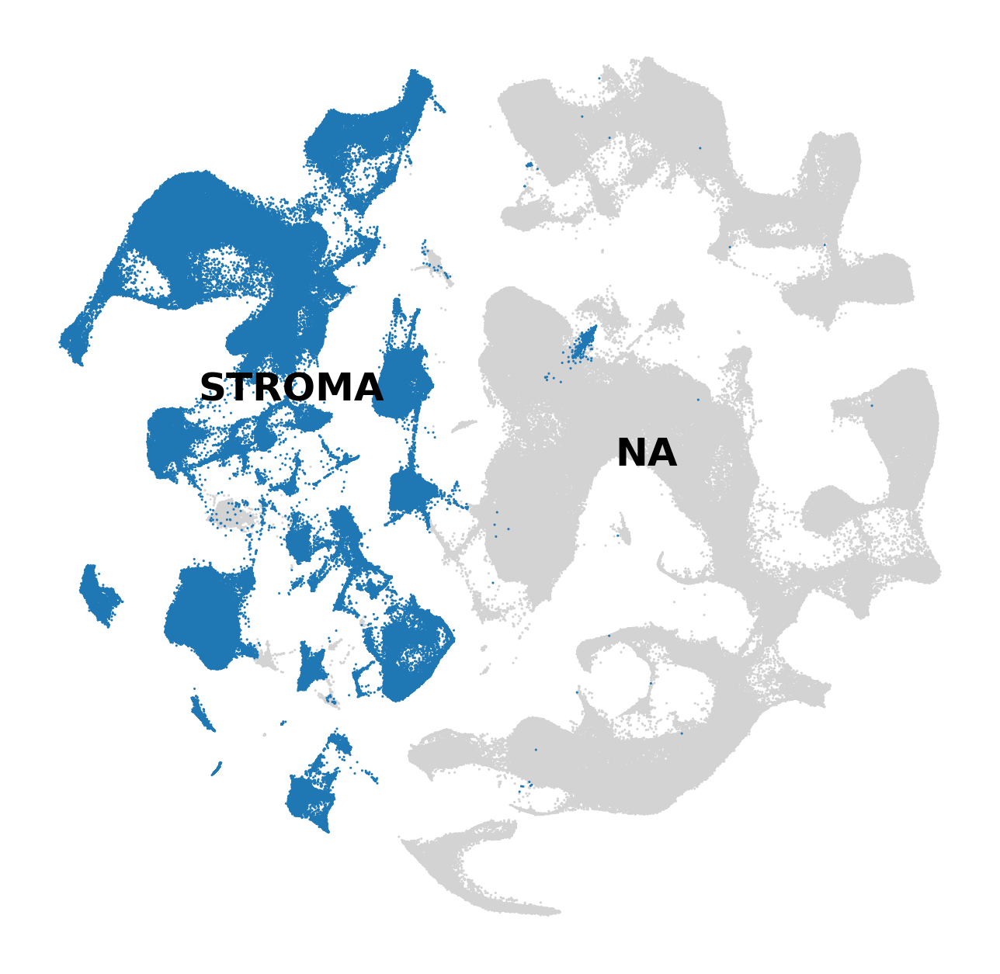

... storing 'isin_HSC_IMMUNE' as categorical


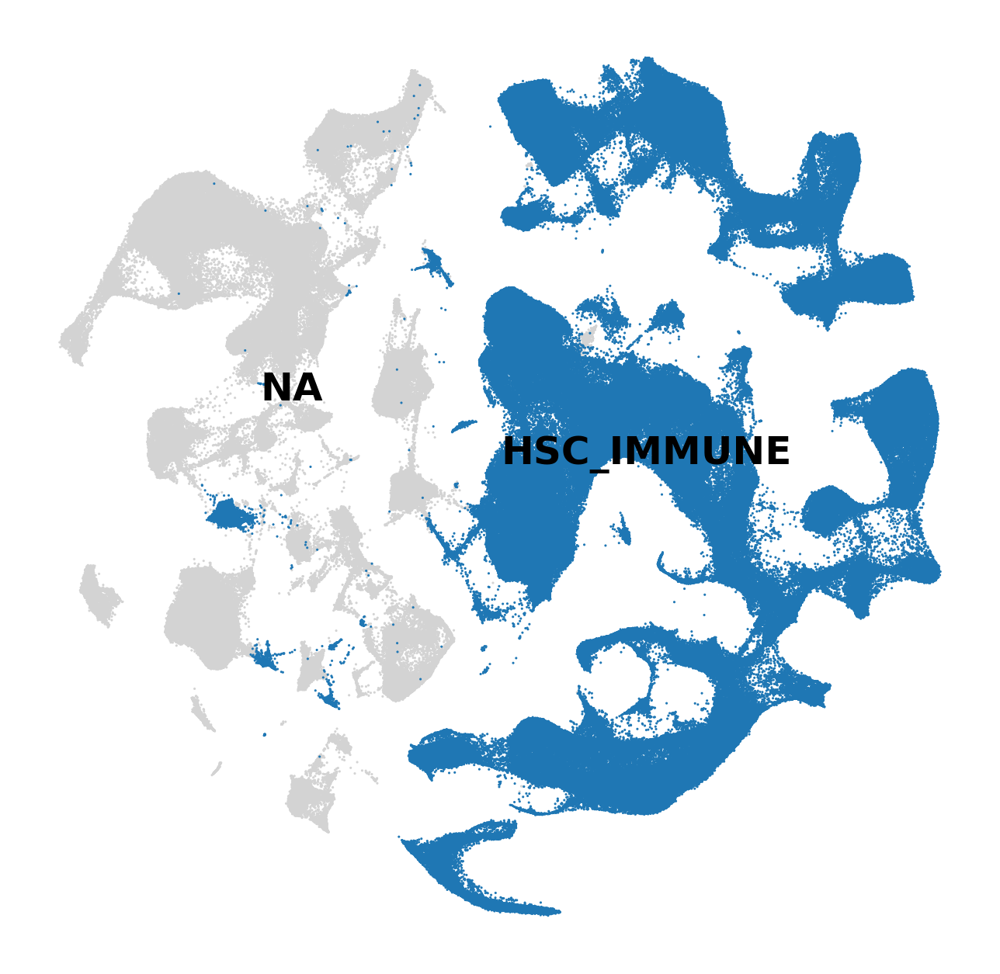

In [159]:
plt.rcParams['figure.figsize'] = [8,8]
for spl in split_hierarchy.keys():
    adata.obs['isin_' + spl] = [spl if x in split_dict[spl]['cells'] else np.nan for x in adata.obs_names]
    sc.pl.umap(adata, color='isin_' + spl, size=5, frameon=False, legend_loc='on data', groups=[spl], title='', 
              save='annotation_hierarchy_'+spl+'.pdf')

... storing 'isin_MYELOID_V2' as categorical


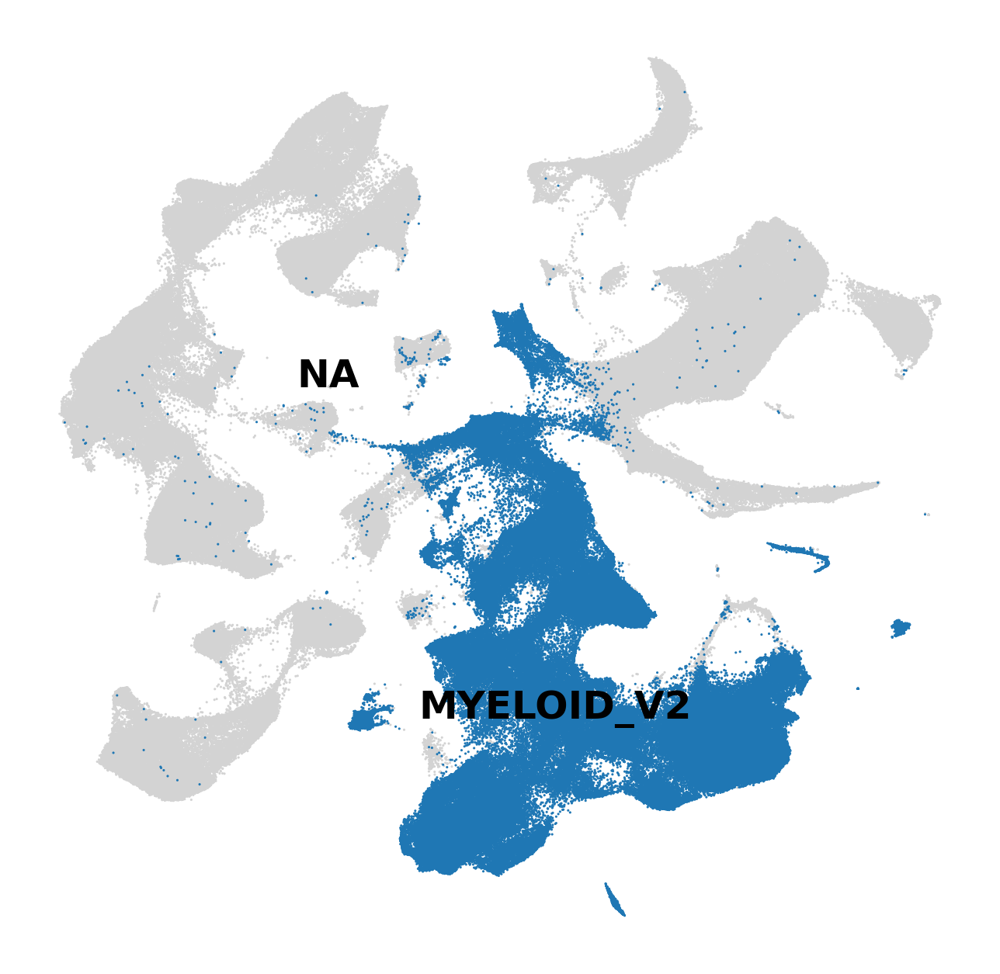

... storing 'isin_LYMPHOID' as categorical


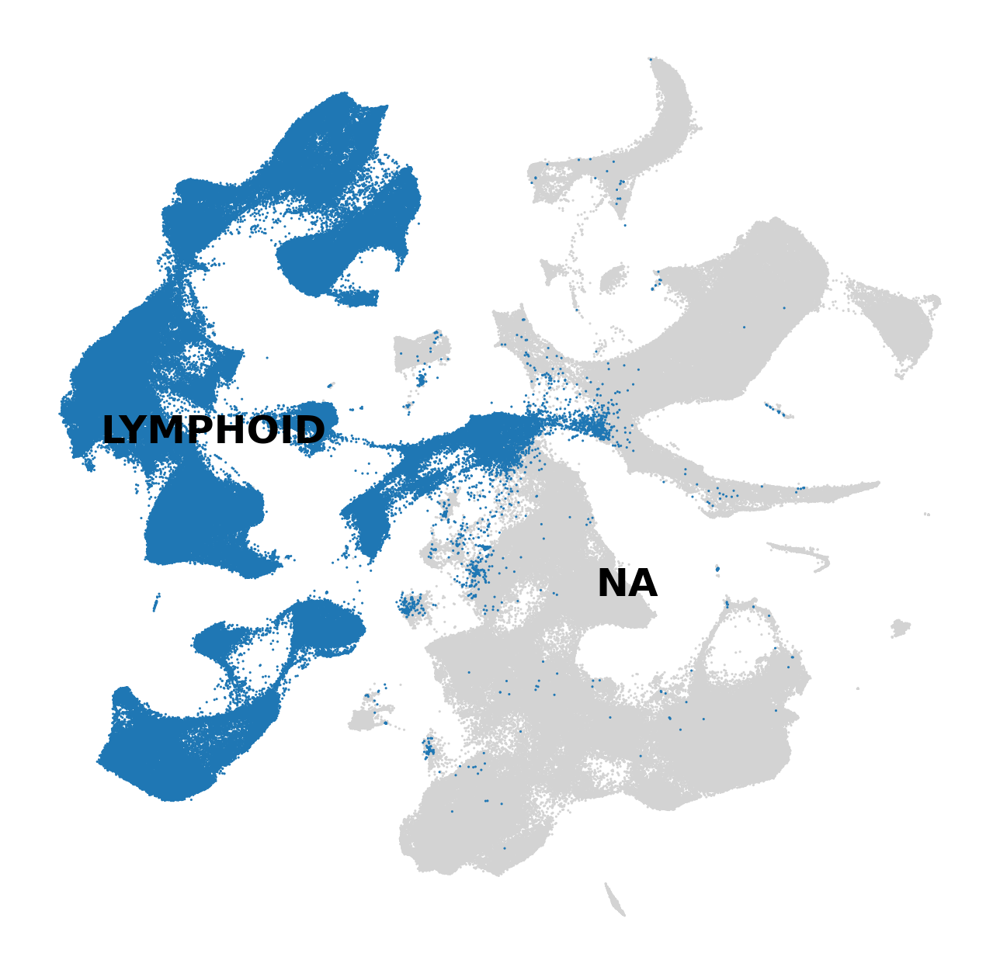

... storing 'isin_MEM_PROGENITORS' as categorical


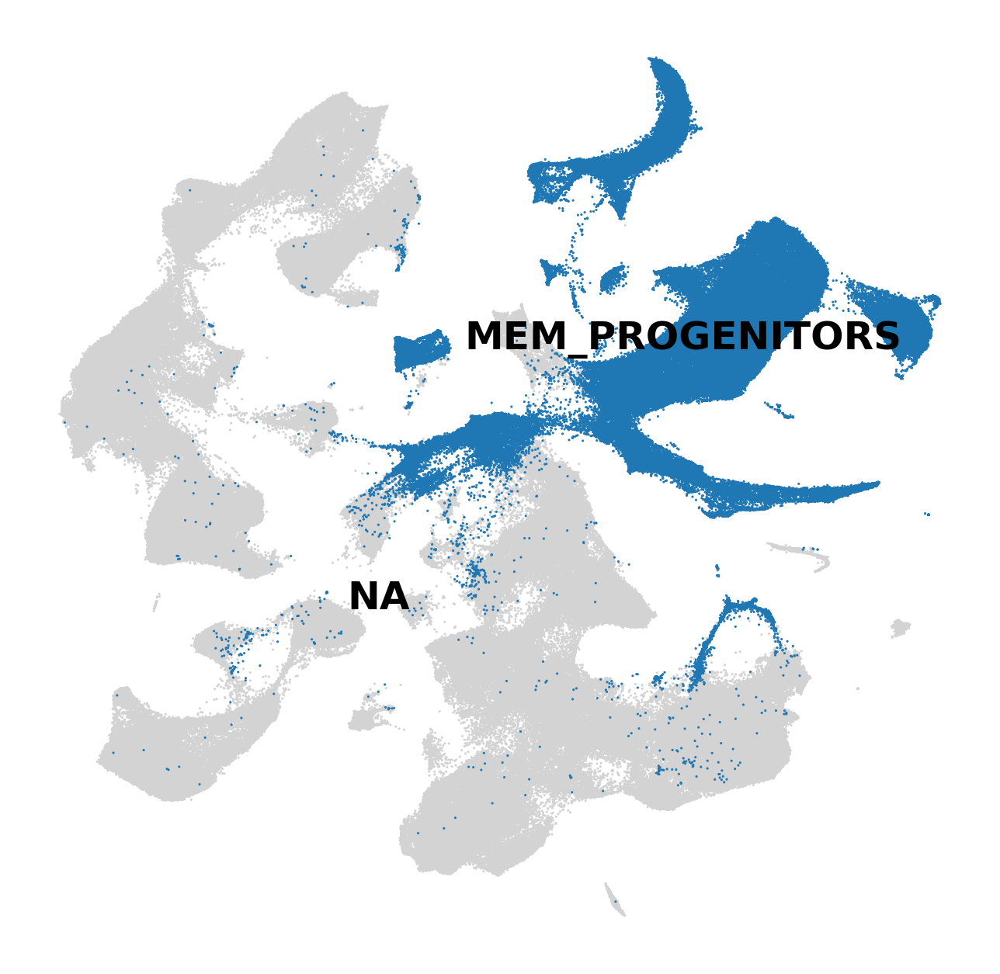

... storing 'isin_HSC_PROGENITORS' as categorical


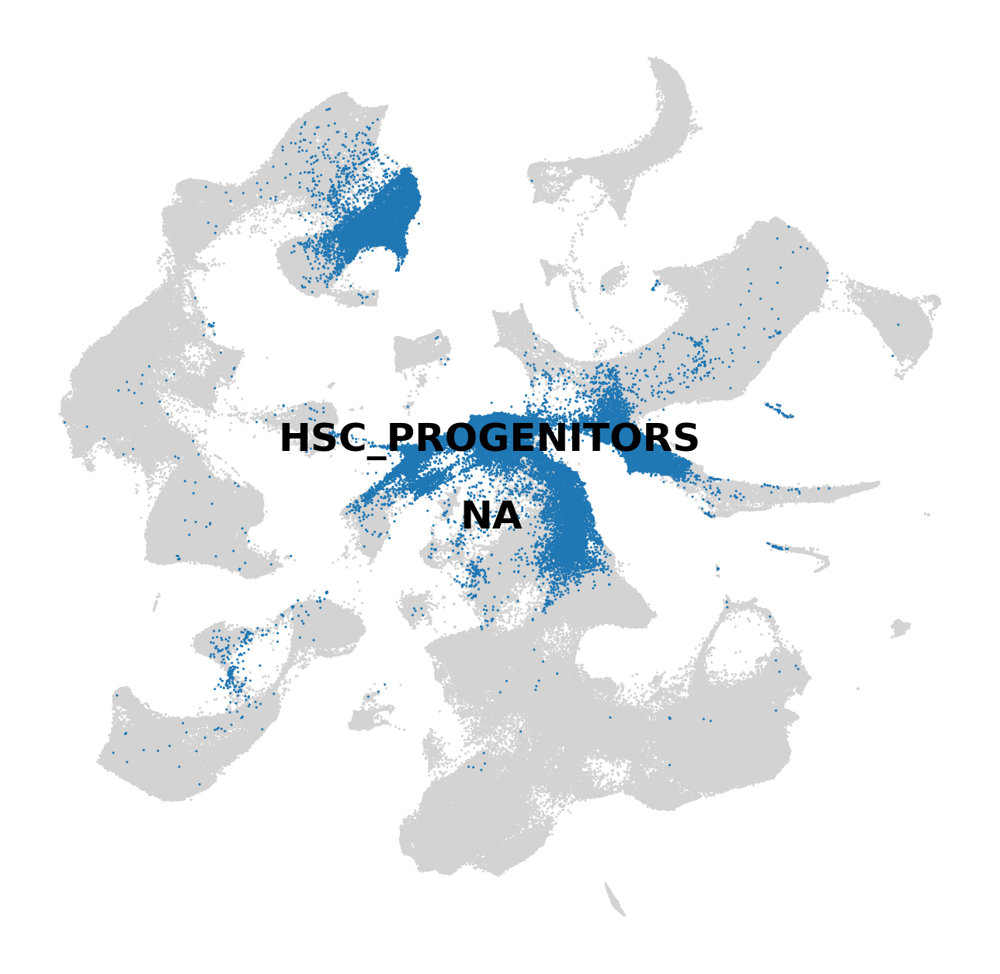

In [160]:
emb_spl = "HSC_IMMUNE"

split_embedding = anndata.AnnData(obs = split_dict[emb_spl]['embedding'])
split_embedding.obsm["X_umap"] = split_dict[emb_spl]['embedding'].copy()
split_embedding.obs_names = split_dict[emb_spl]['cells'].copy()

plt.rcParams['figure.figsize'] = [8,8]
for spl in split_hierarchy[emb_spl].keys():
    split_embedding.obs['isin_' + spl] = [spl if x in split_dict[spl]['cells'] else np.nan for x in split_embedding.obs_names]
    sc.pl.umap(split_embedding, color='isin_' + spl, size=5, frameon=False, legend_loc='on data', groups=[spl], title='',
              save='annotation_hierarchy_embedding'+emb_spl +'_color'+spl+'.pdf')

... storing 'isin_NKT' as categorical


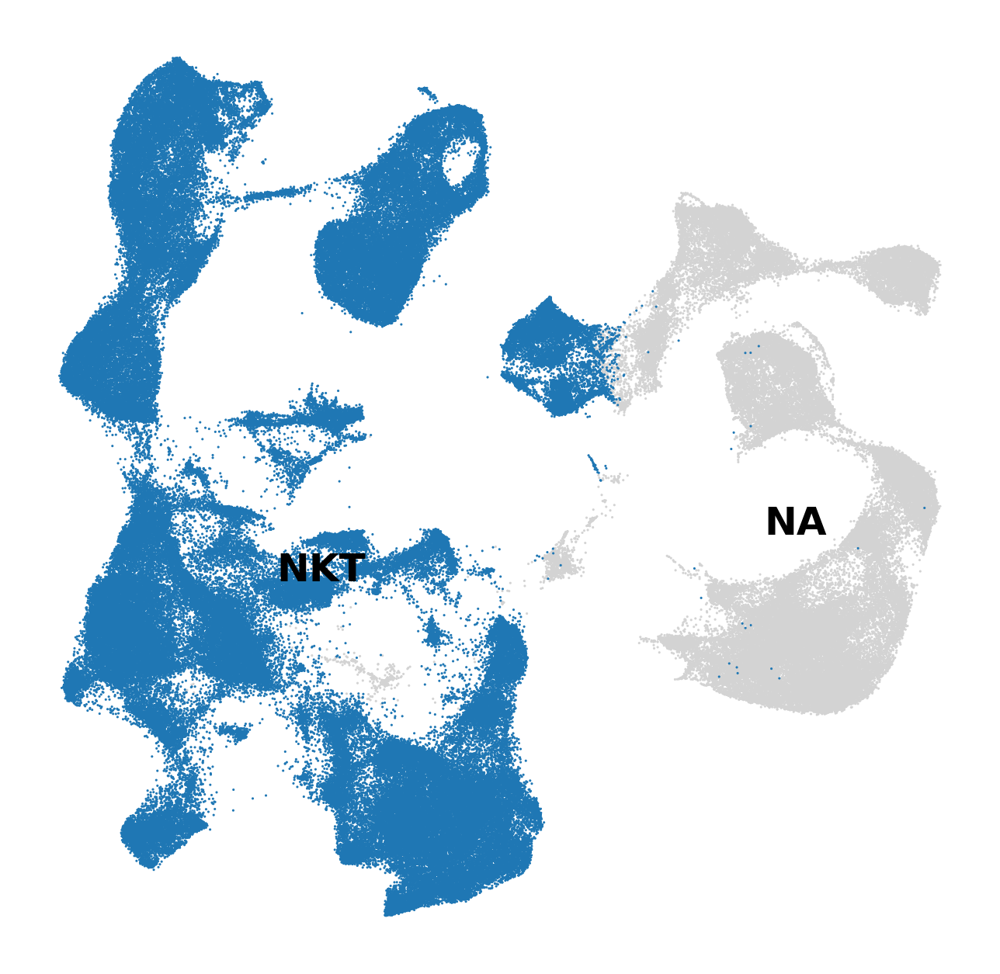

In [166]:
emb_spl = "LYMPHOID"

split_embedding = anndata.AnnData(obs = split_dict[emb_spl]['embedding'])
split_embedding.obsm["X_umap"] = split_dict[emb_spl]['embedding'].copy()
split_embedding.obs_names = split_dict[emb_spl]['cells'].copy()

plt.rcParams['figure.figsize'] = [8,8]
for spl in split_hierarchy['HSC_IMMUNE'][emb_spl]:
    split_embedding.obs['isin_' + spl] = [spl if x in split_dict[spl]['cells'] else np.nan for x in split_embedding.obs_names]
    sc.pl.umap(split_embedding, color='isin_' + spl, size=5, frameon=False, legend_loc='on data', groups=[spl], title='',
              save='annotation_hierarchy_embedding'+emb_spl +'_color'+spl+'.pdf')

## Visualize cells that have antigen-receptor info

In [9]:
output_dir = data_dir + 'cellxgene_h5ad_files/scRNA_data/'
adata = sc.read_h5ad(output_dir + 'PAN.A01.v01.raw_count.{t}.PFI.embedding.h5ad'.format(t=timestamp), backed='r')

In [82]:
adata_tcr = sc.read_h5ad(tcr_input_dir + "PAN.A01.v01.raw_count.20210429.LYMPHOID.embedding.BCR.h5ad")
vdj_obs_names = adata_tcr.obs_names[adata_tcr.obs.has_contig!='no contig']


In [83]:
adata_tcr.obs['status_summary'].unique()

['No_contig', 'IGH + IGK', 'IGH + IGL', 'IGH_only']
Categories (4, object): ['No_contig', 'IGH + IGK', 'IGH + IGL', 'IGH_only']

In [92]:
adata_tcr.obs['receptor_subtype'].unique()

['TRG+TRD', 'ambiguous', 'TRA+TRB', 'no IR', 'multichain']
Categories (5, object): ['TRG+TRD', 'ambiguous', 'TRA+TRB', 'no IR', 'multichain']

In [96]:
tcr_input_dir = data_dir + 'cellxgene_h5ad_files/scVDJ_data/'
for vdj_type in ["BCR", "abTCR", "gdTCR"]:
    if vdj_type == 'BCR':
        adata_tcr = sc.read_h5ad(tcr_input_dir + "PAN.A01.v01.raw_count.20210429.LYMPHOID.embedding.BCR.h5ad")
        vdj_obs_names = adata_tcr.obs_names[adata_tcr.obs.status_summary.isin(['IGH + IGK','IGH + IGL'])]
    else:
        adata_tcr = sc.read_h5ad(tcr_input_dir + "PAN.A01.v01.raw_count.20210429.NKT.embedding.{v}.h5ad".format(v=vdj_type))
        if vdj_type=='gdTCR':
            cond1 = adata_tcr.obs.chain_pairing.isin(['single pair','extra VJ','extra VDJ','two full chains'])
            cond2 = adata_tcr.obs.receptor_subtype=='TRG+TRD'   
            vdj_obs_names = adata_tcr.obs_names[cond1 & cond2]
        else:
            vdj_obs_names = adata_tcr.obs_names[adata_tcr.obs.chain_pairing.isin(['single pair','extra VJ','extra VDJ','two full chains'])]
    adata.obs['has_paired_{v}'.format(v=vdj_type)] = adata.obs_names.isin(vdj_obs_names).astype('int')

In [94]:
adata.obs['anno_group'] = [anno_groups_dict_rev[x] if type(x)==str else np.nan for x in adata.obs['anno_lvl_2_final_clean']]

In [99]:
adata.obs[['has_paired_abTCR','has_paired_gdTCR','has_paired_BCR']].sum()

has_paired_abTCR    28582
has_paired_gdTCR      527
has_paired_BCR      14903
dtype: int64

In [97]:
adata.obs[['has_paired_abTCR','has_paired_gdTCR','has_paired_BCR']] = adata.obs[['has_paired_abTCR','has_paired_gdTCR','has_paired_BCR']].astype('int')

In [90]:
scv.settings.figdir = figdir

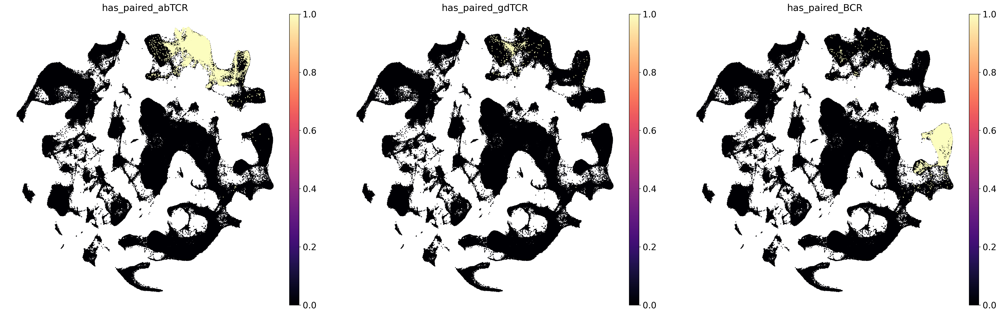

In [101]:
plt.rcParams['figure.figsize'] = [10,10]
sc.pl.umap(adata, color=['has_paired_abTCR','has_paired_gdTCR','has_paired_BCR'], 
            size=10, cmap='magma', frameon=False,
            save="has_vdj_embeddings.pdf")

In [113]:
prop_vdj = adata.obs[['has_VDJ_abTCR','has_VDJ_gdTCR','has_VDJ_BCR', 'anno_group']]
n_vdj = prop_vdj.groupby('anno_group').sum()
size_vdj = prop_vdj.groupby('anno_group').size()

In [115]:
n_vdj

,has_VDJ_abTCR,has_VDJ_gdTCR,has_VDJ_BCR
anno_group,,,
B CELLS,1,0,14081
ERYTHROID CELLS,0,0,0
ILC,58,9,2
MYELOID,0,0,2
NK/T CELLS,27619,515,68
OTHER,901,3,742
PROGENITORS,3,0,8
STROMA,0,0,0


In [114]:
n_vdj.T/size_vdj

anno_group,B CELLS,ERYTHROID CELLS,ILC,MYELOID,NK/T CELLS,OTHER,PROGENITORS,STROMA
has_VDJ_abTCR,0.000016,0.0,0.008357,0.000000,0.182769,0.038910,0.000138,0.0
has_VDJ_gdTCR,0.000000,0.0,0.001297,0.000000,0.003408,0.000130,0.000000,0.0
has_VDJ_BCR,0.219954,0.0,0.000288,0.000008,0.000450,0.032044,0.000368,0.0


Number of libraries with VDJ sequencing

In [110]:
(adata.obs[['has_paired_abTCR','has_paired_gdTCR','has_paired_BCR', 'file']].groupby('file').sum()!=0).sum()

has_paired_abTCR    57
has_paired_gdTCR    16
has_paired_BCR      39
dtype: int64

In [112]:
61/221

0.27601809954751133